<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Preparing-the-Data" data-toc-modified-id="Preparing-the-Data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Preparing the Data</a></span><ul class="toc-item"><li><span><a href="#Compiling-station-information" data-toc-modified-id="Compiling-station-information-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Compiling station information</a></span></li><li><span><a href="#Compiling-Pollution-Data" data-toc-modified-id="Compiling-Pollution-Data-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Compiling Pollution Data</a></span></li></ul></li><li><span><a href="#Map-components" data-toc-modified-id="Map-components-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Map components</a></span><ul class="toc-item"><li><span><a href="#Pollution-Colormap" data-toc-modified-id="Pollution-Colormap-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Pollution Colormap</a></span></li><li><span><a href="#Pollution-line-plot" data-toc-modified-id="Pollution-line-plot-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Pollution line plot</a></span></li><li><span><a href="#Monitoring-Station" data-toc-modified-id="Monitoring-Station-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Monitoring Station</a></span></li><li><span><a href="#Fire-Map" data-toc-modified-id="Fire-Map-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Fire Map</a></span></li></ul></li><li><span><a href="#Case-Studies" data-toc-modified-id="Case-Studies-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Case Studies</a></span><ul class="toc-item"><li><span><a href="#PM2.5" data-toc-modified-id="PM2.5-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>PM2.5</a></span></li><li><span><a href="#NO2" data-toc-modified-id="NO2-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>NO2</a></span></li><li><span><a href="#During-Covid-Shutdown" data-toc-modified-id="During-Covid-Shutdown-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>During Covid Shutdown</a></span></li><li><span><a href="#Over-NewYear" data-toc-modified-id="Over-NewYear-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Over NewYear</a></span></li><li><span><a href="#Songkarn-Day" data-toc-modified-id="Songkarn-Day-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Songkarn Day</a></span></li></ul></li></ul></div>

In this notebook, I build several pollution colormap images over a date range. The colormap images are then combined into an animation. This colormap images can show the cities, which are the source of the pollution and how the pollution travel. When overlaying with the burning hotspots data, this visualization helps confirm/deny the hypothesis about the major pollution sources. For example, as this notebook will show, the PM2.5 level in ASEAN cities are due to the burning hotspots. By plotting the pollution map over a long holidays, the animation helps understand the contribution of the traffic toward various pollutants such as the NO2 level.

This notebook explain in details how each part of the plot is build. If you do not want to know the details, please skip to the last [Case Studies](#Case-Studies-3) section to see the final code. 

In [211]:
#  Load the "autoreload" extension so that code can change
%load_ext autoreload
%reload_ext autoreload
from pathlib import Path

#  always reload modules so that as you change code in src, it gets loaded
%autoreload 2
%matplotlib inline

import sys
sys.path.append('../')
from src.imports import *
from src.gen_functions import *
from src.visualization.vis_data import *
from src.visualization.mapper import *
output_notebook()
plt.rcParams.update({'font.size': 14})

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Loading BokehJS ...

# Preparing the Data

The first step is to compile the data and station locations from all 4 data sources. My data sources are:

1. Berkekely Earth database 
2. air4thai data from Thailand Pollution Control Department http://air4thai.pcd.go.th/webV2/
3. CMU project data http://cmuccdc.org
4. US Embassy data https://www.airnow.gov/international/us-embassies-and-consulates/

I have a `src.visualization.mapper.Mapper` object to in charge of the data building and map maker.

## Compiling station information

I need station locations in Mercators coordinates and adding source label and station id (if not already exists). The station information for each source are stored in each folder as a json file, which need to put together. 

Note: the following function are under Mapper object. I put it here, just for completeness.

In [105]:
mapper = Mapper()
mapper.load_()

number of stations = (922, 23)


In [ ]:
    def build_b_station(self, b_folder='pm25/', prefix='berk'):
        """Compile Berkekely Earth data station and add nessary information.

        Args:
            b_folder(optional): name of the data folder
            predix(optional): name of the stationid prefix 

        Returns: pd.DataFrame
            dataframe of the station information 

        """
        b_folder = self.maindata_folder + b_folder 

        # process load station info
        with open(b_folder + 'cities_info.json') as f:
            b_stations = json.load(f)

        b_stations = pd.DataFrame(b_stations)

        # obtain Berkeley data location information 
        # add mercadian coordinates
        b_stations['long_km'] = b_stations['Longitude'].apply(merc_x)
        b_stations['lat_km'] = b_stations['Latitude'].apply(merc_y, shift=True)
        # add station id (preparing to merge with other station jsons)
        b_stations['id'] = [f'{prefix}{num}' for num in np.arange(len(b_stations))]
        # add data source 
        b_stations['source'] = 'Berkeley'
        b_stations['City'] = b_stations['City (ASCII)']

        return b_stations

In [47]:
b_stations = mapper.build_b_station()
b_stations.head(2)

,Country,City,City (ASCII),Region,Region (ASCII),Population,Latitude,Longitude,Time Zone,long_km,lat_km,id,source
0,Indonesia,Adiwerna,Adiwerna,Central Java,Central Java,134188,-6.9375,109.1325,Asia/Jakarta,1.214857e+07,-760104.199533,berk0,Berkeley
1,Malaysia,Alor Setar,Alor Setar,Kedah,Kedah,217368,6.121,100.3601,Asia/Kuala_Lumpur,1.117204e+07,687031.536533,berk1,Berkeley


In [53]:
# inspect air4thai stations 
pcd_stations = mapper.build_pcd_station()
pcd_stations.head(2)

,id,nameTH,nameEN,areaTH,areaEN,stationType,Latitude,Longitude,LastUpdate,long_km,lat_km,Country,City,source
0,o20,ศาลากลางจังหวัดกระบี,Krabi Town Hall,"ต.ปากน้ำ อ.เมือง, กระบี่","Mueang District, Krabi",MOBILE,8.059199,98.918138,"{'date': '2020-11-01', 'time': '03:00', 'PM25'...",1.101152e+07,9.030689e+05,Thailand,Krabi,TH_PCD
1,02t,มหาวิทยาลัยราชภัฏบ้านสมเด็จเจ้าพระยา,Bansomdejchaopraya Rajabhat University,"แขวงหิรัญรูจี เขตธนบุรี, กรุงเทพฯ","Hiran Ruchi, Khet Thon Buri, Bangkok",GROUND,13.732994,100.488239,"{'date': '2020-11-01', 'time': '04:00', 'PM25'...",1.118630e+07,1.542575e+06,Thailand,Bangkok,TH_PCD


In [55]:
# inspect cmu stations 
cmu_stations = mapper.build_cmu_station()
cmu_stations.head(2)

,id,dustboy_uri,dustboy_name_th,dustboy_name_en,Latitude,Longitude,dustboy_version,long_km,lat_km,Country,City,source
0,5246,Luangnuea,ต. หลวงเหนือ อ. งาว จ.ลำปาง,"T. Luang Nuea, A. Ngao, Lampang",18.75294444,99.97916667,mini,1.112963e+07,2.121491e+06,Thailand,Lampang,TH_CMU
1,5275,N-125,โรงพยาบาลสมเด็จพระเจ้าตากสินมหาราช จ. ตาก,"Somdejphrataksinmaharaj Hospital, Tak",16.8729937,99.1316728,mini,1.103529e+07,1.902901e+06,Thailand,Tak,TH_CMU


In [58]:
# inspect US embassy stations 
usemb_stations = mapper.build_usemb_station()
usemb_stations.head(2)

,City,Country,Latitude,Longitude,long_km,lat_km,id,source
0,Hanoi,Vietnam,21.02163,105.818977,1.177971e+07,2.388624e+06,usem0,US_emb
1,JakartaSouth,Indonesia,-6.18086,106.830112,1.189227e+07,-6.758937e+05,usem1,US_emb


In [61]:
# this fuction concatenate all station data into a single file and save 
mapper.build_station_info()

number of stations = (922, 23)


## Compiling Pollution Data

The station information is used to compile data from all station into a single data file. The pollution data from all stations are too large to fit in a memory, so I have to build in a separate section and append to the old file. I have to make sure that the columns order are the same to avoid putting pollution data into a wrong column.

Compiling all pollution data is done inside `mapper.build_pollution_all()` function. 

In [74]:
mapper.build_pollution_all()

no data file for station o20 in folder ../data/aqm_hourly2/
no data file for station o20 in folder ../data/aqm_hourly3/
no data file for station o28 in folder ../data/aqm_hourly2/
no data file for station o28 in folder ../data/aqm_hourly3/
no data file for station m3 in folder ../data/aqm_hourly2/
no data file for station m3 in folder ../data/aqm_hourly3/
no data file for station o26 in folder ../data/aqm_hourly2/
no data file for station o26 in folder ../data/aqm_hourly3/
no data file for station o21 in folder ../data/aqm_hourly2/
no data file for station o21 in folder ../data/aqm_hourly3/
no old and new data for station o21
no data file for station o27 in folder ../data/aqm_hourly2/
no data file for station o27 in folder ../data/aqm_hourly3/
no data file for station o22 in folder ../data/aqm_hourly2/
no data file for station o22 in folder ../data/aqm_hourly3/
no data file for station o63 in folder ../data/aqm_hourly2/
no data file for station o63 in folder ../data/aqm_hourly3/
no old



0it [00:00, ?it/s]

2it [00:00, 11.02it/s]

4it [00:00, 10.95it/s]

5it [00:00,  8.62it/s]

6it [00:00,  7.34it/s]

7it [00:00,  6.84it/s]

9it [00:01,  7.37it/s]

10it [00:01,  6.76it/s]

11it [00:01,  6.32it/s]

12it [00:01,  6.55it/s]

13it [00:01,  6.82it/s]

15it [00:01,  8.45it/s]

17it [00:01, 10.08it/s]

20it [00:02, 12.42it/s]

23it [00:02, 14.32it/s]

26it [00:02, 16.93it/s]

29it [00:02, 13.01it/s]

31it [00:02, 13.46it/s]

33it [00:03, 12.03it/s]

35it [00:03, 12.33it/s]

../data/aqm_hourly_final/o21.csv does not exist




37it [00:03, 13.74it/s]

39it [00:03, 12.14it/s]

43it [00:03, 15.20it/s]

../data/aqm_hourly_final/o63.csv does not exist




46it [00:04, 10.85it/s]

49it [00:04, 12.60it/s]

51it [00:04, 11.06it/s]

53it [00:04, 11.01it/s]

55it [00:04, 12.43it/s]

57it [00:04, 11.44it/s]

59it [00:05,  9.02it/s]

61it [00:05,  9.51it/s]

63it [00:05, 10.11it/s]

65it [00:05,  9.69it/s]

67it [00:06,  7.91it/s]

71it [00:06, 10.30it/s]

74it [00:06, 12.77it/s]

77it [00:06, 10.51it/s]

80it [00:07, 11.42it/s]


pcd data shape (6725806, 8)




0it [00:00, ?it/s]

4it [00:00, 34.27it/s]

data_columns Index(['datetime', 'PM2.5', 'PM10', 'O3', 'CO', 'NO2', 'SO2', 'stationid'], dtype='object')




9it [00:00, 36.70it/s]

15it [00:00, 41.42it/s]

21it [00:00, 45.36it/s]

26it [00:00, 46.03it/s]

31it [00:00, 46.08it/s]

36it [00:00, 45.89it/s]

41it [00:00, 40.10it/s]

46it [00:01, 30.74it/s]

52it [00:01, 35.10it/s]

56it [00:01, 34.78it/s]

61it [00:01, 36.62it/s]

65it [00:01, 37.41it/s]

71it [00:01, 40.46it/s]

77it [00:01, 43.31it/s]

82it [00:01, 42.59it/s]

87it [00:02, 43.50it/s]

93it [00:02, 46.69it/s]

98it [00:02, 36.75it/s]

104it [00:02, 40.13it/s]

109it [00:02, 38.65it/s]

115it [00:02, 41.89it/s]

121it [00:02, 42.31it/s]

126it [00:03, 41.77it/s]

131it [00:03, 37.46it/s]

135it [00:03, 35.62it/s]

139it [00:03, 36.25it/s]

143it [00:03, 35.61it/s]

147it [00:03, 29.73it/s]

151it [00:03, 30.91it/s]

155it [00:03, 32.73it/s]

160it [00:04, 36.31it/s]

165it [00:04, 38.79it/s]

170it [00:04, 38.55it/s]

177it [00:04, 42.48it/s]

185it [00:04, 49.02it/s]

191it [00:04, 50.47it/s]

197it [00:04, 50.68it/s]

203it [00:04, 49.50it/s]

209it [00:05, 39.59it/s]

215

cmu data shape (1985269, 8)




0it [00:00, ?it/s]

2it [00:00, 17.45it/s]

4it [00:00, 17.31it/s]

7it [00:00, 17.42it/s]

11it [00:00, 20.03it/s]

13it [00:00, 17.35it/s]

15it [00:00, 14.52it/s]

18it [00:01, 15.45it/s]

20it [00:01, 14.82it/s]

23it [00:01, 16.45it/s]

25it [00:01, 15.43it/s]

27it [00:01, 15.48it/s]

31it [00:01, 18.62it/s]

34it [00:01, 19.28it/s]

37it [00:02, 19.24it/s]

40it [00:02, 17.98it/s]

42it [00:02, 17.63it/s]

47it [00:02, 20.55it/s]

52it [00:02, 23.44it/s]

55it [00:02, 19.97it/s]

58it [00:02, 19.36it/s]

61it [00:03, 17.08it/s]

63it [00:03, 17.09it/s]

65it [00:03, 14.10it/s]

67it [00:03, 12.61it/s]

69it [00:03, 13.20it/s]

71it [00:04, 13.22it/s]

73it [00:04, 14.41it/s]

75it [00:04, 14.22it/s]

77it [00:04, 15.38it/s]

79it [00:04, 15.96it/s]

82it [00:04, 16.91it/s]

85it [00:04, 17.63it/s]

87it [00:04, 16.52it/s]

89it [00:05, 15.39it/s]

91it [00:05, 13.68it/s]

93it [00:05, 14.28it/s]

96it [00:05, 16.49it/s]

99it [00:05, 18.60it/s]

102it [00:05, 17.29it/s]

106it

Berkeley data shape (8948684, 8)




0it [00:00, ?it/s]

1it [00:05,  5.77s/it]

2it [00:11,  5.83s/it]

3it [00:17,  5.93s/it]

4it [00:23,  5.69s/it]

5it [00:24,  4.43s/it]

6it [00:27,  4.55s/it]


US Embassy data shape (211964, 8)


# Map components

I would like to overlay several types information on the same plot. 

- Pollution color map showing spatial variation of pollution.
- Line plot of the pollution in a certain city
- (optional) burning hotspot locations 
- (optional) location of the monitoring station used to build the pollution color map.

First, I need to determine the center coordinate and the width of the x and y axis. This setting is done under `mapper.mapset_dict()`. There are default setting, which can be override by passing optional keyword argument. This step also load pollution data and add as `mapper.dataset` attribute.

In [276]:
# use coordinate from the 
mapper.set_map_params(center_city='Bangkok')
mapper.map_dict

{'city_x': 11187764.67,
 'city_y': 1544967.92,
 'stepx': 500000.0,
 'stepy': 500000.0,
 'xmap_range': [10787764.67, 11787764.67],
 'ymap_range': [1394967.92, 1944967.92],
 'inter_range': [2, 2.5],
 'gridsize': 5000.0,
 'plot_height': 200,
 'center_city': 'Bangkok',
 'xinter_range': [10187764.67, 12437764.67],
 'yinter_range': [544967.9199999999, 2794967.92]}

The map setting is used to build a base map.

In [278]:
p = plot_basemap(mapper.map_dict['xmap_range'], mapper.map_dict['ymap_range'])
show(p)

## Pollution Colormap 

Pollution colormap is calculated by interpollation of the pollution data for all stations in the regions of interest. Because the pollution data are too large to fit in the memory, only the data in the date of interested are load, and these data are interpolated to form a pollution data matrix. In details, the steps are 

1. Load the data from a specified daterange. `Using mapper.get_poll_by_daterange()`. This addd polldata attribute to the mapper object.
2. Pick a datetime of interest and build a pollution matrix for that datetime by interpolation

In [170]:
start_date = '2020-10-20'
end_date = '2020-10-25'
mapper.get_poll_by_daterange(start_date, end_date)
mapper.polldata.head(2)

,datetime,PM2.5,PM10,O3,CO,NO2,SO2,stationid,id,Latitude,Longitude,long_m,lat_m,date
0,2020-10-20 00:00:00,7.0,NaN,NaN,NaN,NaN,NaN,o20,o20,8.059199,98.918138,11011516.75,903068.94,2020-10-20
1,2020-10-20 01:00:00,8.0,NaN,NaN,NaN,NaN,NaN,o20,o20,8.059199,98.918138,11011516.75,903068.94,2020-10-20


In [129]:
# create the interpollation data matrix 
poll_inter = mapper.inter_pollution('2020-10-20 10:00:00', pollutant='PM2.5')
poll_inter.head(2)

,long_km,lat_km,PM2.5
0,10387764.67,744967.92,17.073488
1,10392764.67,744967.92,17.050873


In [154]:
# set colorbar
mapper.set_pollutant_cbar(pollutant='PM2.5')

# add colormap
p = mapper.add_poll_colormap(datetime='2020-10-20 13:00:00')
show(p)

## Pollution line plot

It is helpful to plot the time series pollution level of the city at the center of the map along with the pollution colormap. This is done adding a line plot of the average pollution value.

In [173]:
# take average pollution value of the city specified by mapper.center_city 
mapper.avg_city_poll()
mapper.avg_polldata.head()

,PM2.5,PM10,O3,CO,NO2,SO2,Latitude,Longitude,long_m,lat_m
datetime,,,,,,,,,,
2020-10-20 00:00:00,19.250000,40.416667,4.0,0.5680,19.666667,2.0,13.738921,100.54932,1.119310e+07,1.543251e+06
2020-10-20 01:00:00,15.000000,34.916667,4.0,0.7625,18.166667,2.0,13.738921,100.54932,1.119310e+07,1.543251e+06
2020-10-20 02:00:00,12.833333,29.416667,4.5,0.7925,16.333333,2.0,13.738921,100.54932,1.119310e+07,1.543251e+06
2020-10-20 03:00:00,12.416667,30.000000,4.5,0.7325,13.666667,2.0,13.738921,100.54932,1.119310e+07,1.543251e+06
2020-10-20 04:00:00,11.583333,29.000000,4.5,0.7700,16.000000,2.0,13.738921,100.54932,1.119310e+07,1.543251e+06


In [174]:
p2 = mapper.add_line_plot()
show(p2)

## Monitoring Station

One might be interested in location the monitoring stations used to calculate the colormap. 


The figure below shows location of all monitoring stations and their locations for the data in 2020. The PCD stations data has historical pollution data of 6 pollutants (['PM2.5', 'PM10', 'O3', 'CO', 'NO2', 'SO2']) that go back since 2014 or older.  The Chiang Mai University research project(CMU) and Berkeley data only have PM2.5 data. The CMU project started collecting data in 2018. The Berkeley data started in early 2016. Note that the location for Berkeley is the city location, not the exact location of the station.  



In [190]:
mapper.show_station_loc()

## Fire Map

In addition to the pollution map, I also want to overlay in fire activities in the past 48 before the date of interest on the map. This is done by using the function below.

In [201]:
# init dataset object and load the data
dataset = Dataset(mapper.center_city)
dataset.load_()
# extract the fire information 
fire = dataset.fire

In [271]:
# set colorbar
mapper.set_pollutant_cbar(pollutant='PM2.5')

datetime = '2020-10-21 10:00:00'

# add colormap
p = mapper.add_poll_colormap(datetime)

# add hotspot 
mapper.add_fire(p, fire, datetime)
show(p)

fire data on  2020-10-21 10:00:00 12


# Case Studies 

## PM2.5

In late October, there is a short surge in PM2.5 level in Bangkok. During that time the pollution level in the northern cities, ex Chiang Mai, were still low, ruling out possibility of the pollution coming from the north. By looking at the pollution colormap and its time evolution, the we can see that the pollution surge are from burning activities both from near by area and from the eastern region. 

To build the animation, I have to pick a date range and the timestamps to generate the colormap plot. The images of each colormaps are saved and glued together to create a gif file. The entire step are done by calling the function `mapper.make_ani()`. This section explain the detail inside the `make_ani()` function.

In [210]:
# starting from init the map object
mapper = Mapper()
mapper.load_()

# add map setting 
mapper.set_map_params(center_city='Bangkok')

number of stations = (922, 23)


In [213]:
# extract pollution data during the date of interest
start_date = '2020-10-20'
end_date = '2020-10-25'
mapper.get_poll_by_daterange(start_date, end_date)
# take average pollution value of the city specified by mapper.center_city 
mapper.avg_city_poll()

Plotting the pollution map every hour will be too much. The hourly pollution fluctuation are highly influence by the effect of the wind. I decided to pick a subset of hourly data. I choose to plot the data at the peak pollution to show.

The figure below, show the pollution datetime at which the pollution colormap will be generated. 

In [255]:
mapper.get_datasamples(start_date, end_date, peak=True) 

p1 = mapper.add_line_plot(title=f'{mapper.pollutant} level in {mapper.center_city}')
mapper.plot_datasample(p1)
show(p1)

The entire step are done by calling the function `mapper.make_ani()`.

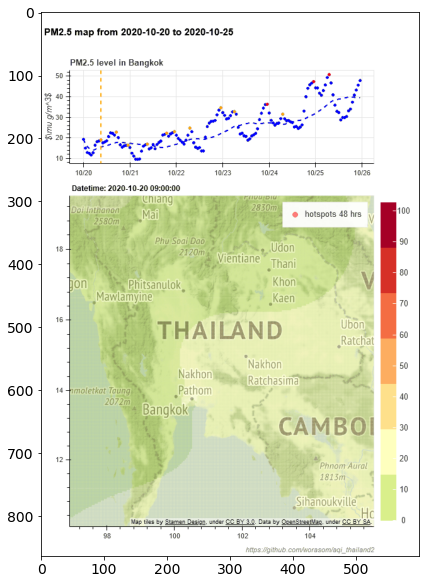

In [285]:
ani_filename = mapper.make_ani(start_date, end_date, pollutant='PM2.5', fire=fire)
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

## NO2

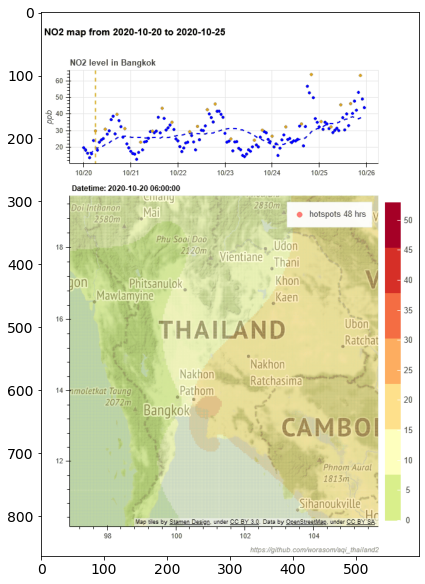

In [290]:
# extract pollution data during the date of interest
start_date = '2020-10-20'
end_date = '2020-10-25'

# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='NO2', fire=fire)
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

## During Covid Shutdown

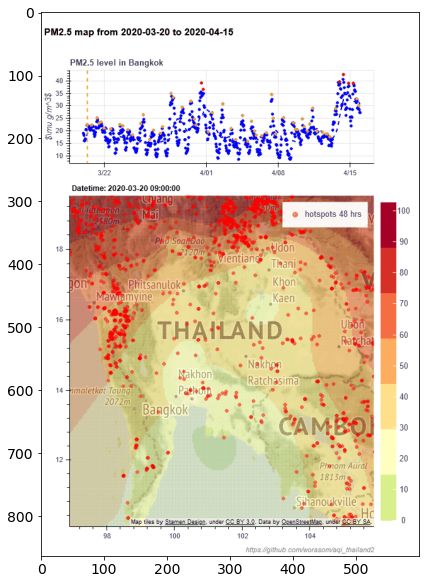

In [293]:
# extract pollution data during the date of interest
start_date = '2020-03-20'
end_date = '2020-04-15'

mapper.get_poll_by_daterange(start_date, end_date)
# take average pollution value of the city specified by mapper.center_city 
mapper.avg_city_poll()

# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='PM2.5', fire=fire)
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

In [ ]:
# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='NO2', fire=fire)
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

In [ ]:
dataset.poll_df['PM2.5'].loc['2020-03-15':'2020-04-20'].plot()

In [ ]:
dataset.poll_df['NO2'].loc['2020-03-15':'2020-04-20'].plot()

## Over NewYear

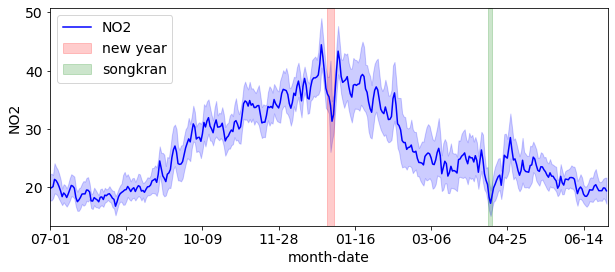

In [204]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.2, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.2, label='songkran')
winter_day_dict, mean_df = plot_season_avg(dataset.poll_df,  'NO2', ax)
ax.legend()

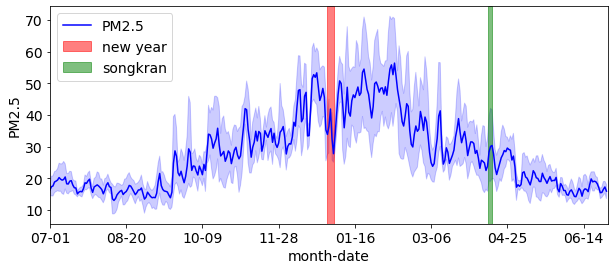

In [205]:
_, ax = plt.subplots(1, 1, figsize=(10, 4), sharex=True)
ax.axvspan(182, 186, color='red',alpha=0.5, label='new year')
ax.axvspan(287, 290, color='green', alpha=0.5, label='songkran')
winter_day_dict, mean_df = plot_season_avg(dataset.poll_df,  'PM2.5', ax)
ax.legend()

In [ ]:
# extract pollution data during the date of interest
start_date = '2019-12-25'
end_date = '2020-01-10'

mapper.get_poll_by_daterange(start_date, end_date)
# take average pollution value of the city specified by mapper.center_city 
mapper.avg_city_poll()

# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='PM2.5', fire=fire, add_title='(New Year)')
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

In [ ]:
# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='NO2', fire=fire, add_title='(New Year)')
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

In [ ]:
dataset.poll_df['PM2.5'].loc[start_date: end_date].plot()

In [ ]:
dataset.poll_df['NO2'].loc[start_date: end_date].plot()

## Songkarn Day

In [ ]:
# extract pollution data during the date of interest
start_date = '2019-04-8'
end_date = '2019-04-18'

mapper.get_poll_by_daterange(start_date, end_date)
# take average pollution value of the city specified by mapper.center_city 
mapper.avg_city_poll()

# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='PM2.5', fire=fire, add_title='(Songkran)')
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

In [ ]:
# take average pollution value of the city specified by mapper.center_city 
ani_filename = mapper.make_ani(start_date, end_date, pollutant='NO2', fire=fire, add_title='(Songkran)')
img = mpimg.imread(ani_filename)

plt.figure(figsize=(10,10))
plt.imshow(img)

In [ ]:
dataset.poll_df['PM2.5'].loc[start_date: end_date].plot()

In [ ]:
dataset.poll_df['NO2'].loc[start_date: end_date].plot()